# AOS DM-30367 - update Euler angle of SW0 - summary 

Input: Show the catalog to be simulated with a recognizable pattern throughout the entire focal plane. I use code that adds points in specific x,y locations to make an appearance of letters

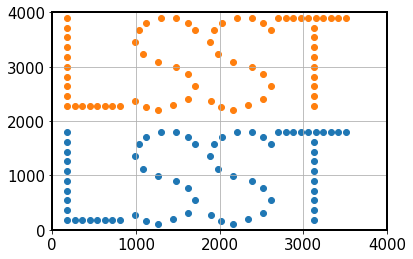

In [33]:
import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import rcParams 
import matplotlib.patheffects as path_effects

from astropy.io import fits
from astropy.visualization import ZScaleInterval
from astropy.table import Table

import run_ps1_functions as func 

from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


xPx = np.zeros(0)
yPx = np.zeros(0)
    
x,y = func.pixel_LSST(xf=0.9, yf=0.9)
xPx = np.append(xPx, x)
yPx = np.append(yPx, y)
plt.scatter(x,y)

x,y = func.pixel_LSST(xf=0.9, yf=0.9, y0=2100)
xPx = np.append(xPx, x)
yPx = np.append(yPx, y)
plt.scatter(x,y)

plt.xlim(0,4000)
plt.ylim(0,4000)
plt.grid()

Make copies of this arrangement adding an xshift and yshift, to effectively tile the entire focalk plane, taking as the reference point R22_S11/. Since there are 7 ccds on each side of R22_S11 and each CCD is ~4072 px, the edges of the FOV are between about -30000 px to +30000 px in R22_S11 CCD coords. The `ccd_xy_to_radec` function comprises of elements of `ts_phosim` `SkySim` and `ts_wep` `WcsSol`, to be more transparent about various imports made:

In [ ]:
xPx_start  = xPx.copy()
yPx_start = yPx.copy()

# offset that letter by +/- N*dx,  from -30000 to +30000 px 
# this is because there are 7 ccds on each side of R22_S11 
# and each CCD is ~4072 px
# so  the edges of the FOX are about -30000 px to +30000 px 
# in R22_S11 CCD coords 

dx = 4000
dy = 4000
xHalfSpan = 35000
yHalfSpan = 35000

# get the ra,dec applying shift to pixel coords. Since 
# the xHalfSpan, yHalfSpan is symmetric, 
# we also have xshift=0 and yshift=0, 
# so that the central letter is included as well 
raList = np.zeros(0)
decList = np.zeros(0)
xPxList = np.zeros(0)
yPxList = np.zeros(0)
for xshift in np.arange(-xHalfSpan, xHalfSpan, dx):
    for yshift in np.arange(-yHalfSpan, yHalfSpan, dy):
        #print(xshift, yshift)
        
        ra, dec, xPx, yPx = func.ccd_xy_to_radec(x_px=xPx_start+xshift, y_px=yPx_start+yshift, 
                                               boresight_ra=0, boresight_dec=0, 
                                               rotskypos=0, sensorNameList = ['R22_S11'])
        
        raList = np.append(raList, ra) #.append(ra)
        decList = np.append(decList, dec) #.append(dec)
        xPxList = np.append(xPxList, xPx)
        yPxList = np.append(yPxList, yPx)

Plot the input catalog:

In [ ]:
# Plot the star 
ra = raList.copy()
ra[ra>180] = ra[ra>180]-360

fig,ax = plt.subplots(1,1,figsize=(25,25))
ax.scatter(ra,decList)
ax.set_xlabel('ra')
ax.set_ylabel('dec')
ax.grid()
plt.savefig("LsstCam_input_catalog_large_LSST.jpeg", bbox_inches='tight')

Save that catalog as the phoSim  instance catalog:

In [ ]:
# make an inst catalog 
coords = Table(data=[raList, decList],  names=['ra','dec'])

# add a column with object id 
coords['objid'] = np.arange(len(coords))
#coords['g'] = [starMag for x in range(len(coords))]

starMag=14
mjd = 57648  # arbitrary observation date 
func.writePhosimInstFile(coords, ra=0, dec=0, rotskypos=0 , 
                    phosimFile='lsstCam_entire_tiled_LSST.inst',  
                    outDir='/project/scichris/aos/images/lsstCam/',
                    passband='g', mjd=mjd, exposure=0.25, obsid=9006002, 
                    defocal=False, constMag=starMag )

## Tool: plotting cameraGeom mosaic (DVCS) 

In [2]:
def plot_cameraGeom(repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiledF/DATA/'),
                   detectorNameList = [ "R04_SW0", "R04_SW1",
                         "R44_SW0", "R44_SW1",
                         "R00_SW0", "R00_SW1",
                         "R40_SW0", "R40_SW1",
                      
                       ] ,
                   ):
    afwDisplay.setDefaultBackend("matplotlib")

    #repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiledF/DATA/')

    # need to specify the calib collections to be able to access the camera 
    instrument = 'LSSTCam'
    butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                     f'{instrument}/calib','run1',
                                                     f'{instrument}/calib/unbounded']
                             )

    dataId0 = dict(instrument=instrument)
    dataset = next(iter(
                        butler.registry.queryDatasets(
                            datasetType='postISRCCD', 
                            collections=['run1'],
                            dataId=dataId0  )
                        )
                   )

    exposure = dataset.dataId["exposure"]

    camera  = butler.get("camera", instrument=instrument, exposure=exposure)

    fig = plt.figure(figsize=(15,15))
    fig.subplots_adjust(hspace=0., wspace=0.0, )

    ax = fig.add_subplot(1, 1, 1)

    disp = afwDisplay.Display(fig)
    disp.scale('asinh', 'zscale', Q=2)
    #disp.scale('linear', 'minmax')
    #disp.scale('asinh', 5, 7000, Q=2)

    disp.setImageColormap('viridis' if True else 'gray')
    dataType = "postISRCCD"


    # use that  to limit what's shown
    #detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

    # set to None to plot everything
    
    mos = cameraGeomUtils.showCamera(camera,
                                 cameraGeomUtils.ButlerImage(butler, dataType, 
                                                             instrument=instrument, 
                                                             exposure=exposure,
                                                             verbose=True),
                                 binSize=16, 
                                 detectorNameList=detectorNameList, 
                                 display=disp, overlay=True, title=f'{instrument}' )

    disp.show_colorbar(False)
    ax.axis("off")

    #plt.savefig('LsstCam_letter_entire_tiledF_wfs.png', bbox_inches='tight')
    return mos

## Simulate the baseline (before changes): lsstCam

    
Executed the following commands  on `lsst-devl02` : 
    
    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib
    
    source "/project/scichris/aos/setup_aos_current.sh"


    cd /home/scichris/notebooks/
    python update_focalplanelayout_lsst.py   # with update_euler = False 
    cd /project/scichris/aos/phosim_syseng4/data/lsst/
    cp focalplanelayout_DM-28557.txt focalplanelayout.txt 
    
    cd /project/scichris/aos/images/lsstCam
    mkdir letter_lsstCam_entire_tiled_LSST_before
    mkdir letter_lsstCam_entire_tiled_LSST_before/raw
    cd letter_lsstCam_entire_tiled_LSST_before
    
    
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/lsstCam_entire_tiled_LSST.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25  -o /project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_before/raw/ > starPhoSimLetter.log 2>&1


    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_before/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_before/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh               
    
    
    /project/scichris/aos/images/lsstCam/lsstCam_entire_tiled_LSST.inst

Reading 189: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 189, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 190: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 190, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 193: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 193, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 194: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 194, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 197: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 197, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam

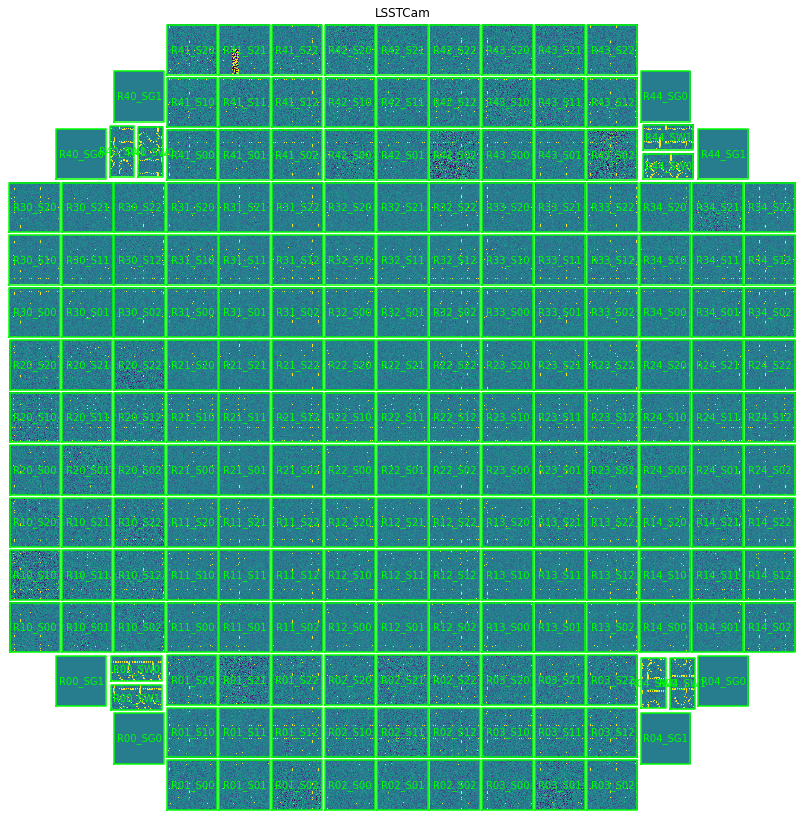

In [4]:
repo_before = 
'/project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_before/DATA/'

mos = plot_cameraGeom(repo_dir = repo_before,
                      detectorNameList=None)

We can see that this is in DVCS as eg. R30 is to the top-left of R22, whereas in CCS it is in bottom-right. As https://sitcomtn-003.lsst.io/ says, in CCS "+x axis points toward raft R42", and "+y axis points toward raft R24". Below illustration is in CCS: <img src='LSST_FocalPlane.png' width="600" height="600">

Thus we transpose the `cameraGeomUtils` image to get to the CCS:

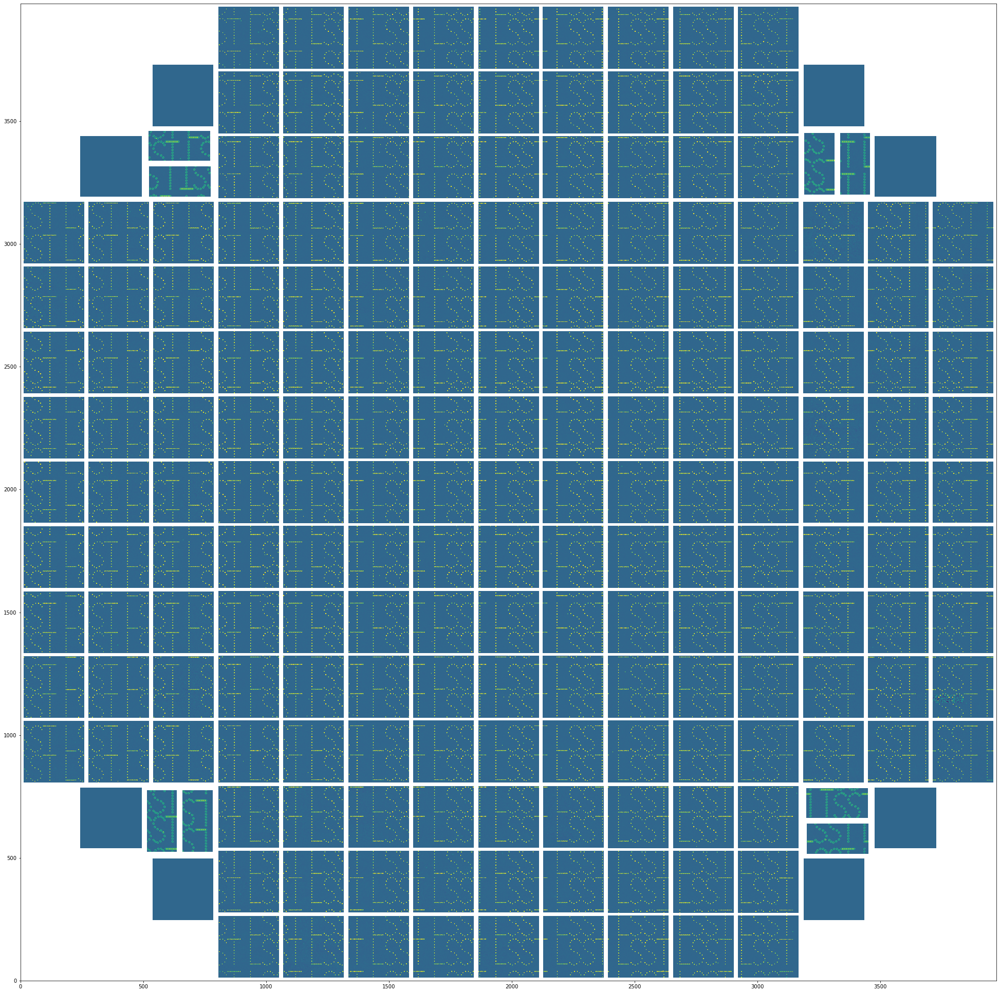

In [5]:
fig,ax = plt.subplots(1,1,figsize=(35,35))
ax.imshow(mos.array.T, origin='lower', vmax=20, vmin=-10)
plt.savefig('letter_lsstCam_entire_tiled_LSST_before.pdf', bbox_inches='tight', dpi=150)


As illustrated, the SW0 sensors (closer to the focal plane) are off by 180 degrees. Remedy that by changing their Euler angle.

Plot only the corner sensors  with `cameraGeomUtils.showCamera()`:

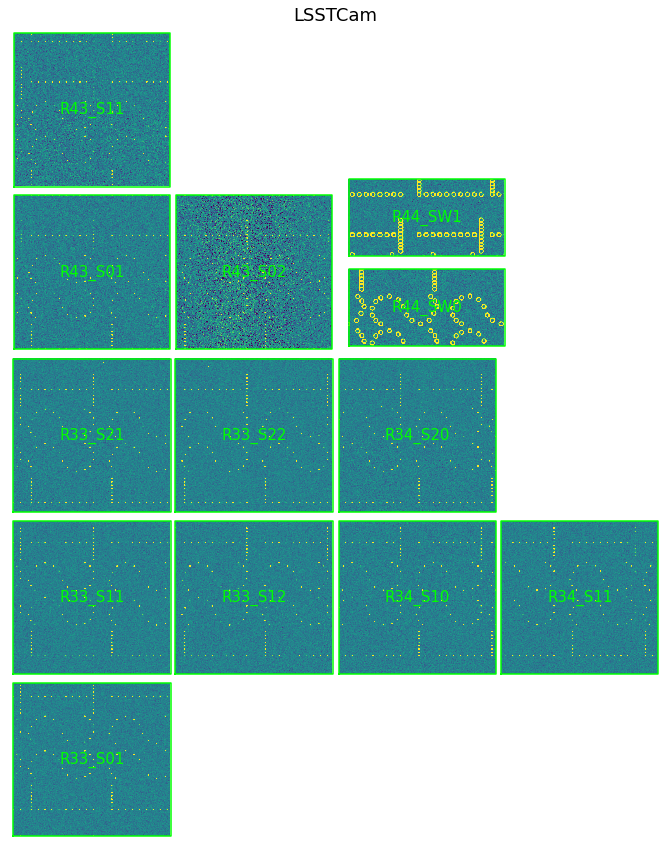

In [35]:
corner_list = ['R34_S11','R34_S10','R34_S20',
                                        'R33_S12','R33_S11','R33_S21','R33_S01','R33_S22',
                                       'R43_S01','R43_S11', 'R43_S02', 'R44_SW0', 'R44_SW1']
mosaic = plot_cameraGeom(repo_dir = repo_before,
                      detectorNameList=corner_list
               )

This is in DVCS.  Plot the x,y transpose of this image to move to CCS:

In [36]:
def plot_corner_with_annotations(mos,vmin,vmax):
    fig,ax = plt.subplots(1,1,figsize=(10,10))
    ax.imshow(mos.array.T, origin='lower',vmin=vmin,vmax=vmax)
    ax.set_xlabel('x px (CCS)')
    ax.set_ylabel('y px  (CCS)')
    yt = 100
    x0 = 50
    dx = 270
    dy = 270
    ct = 'orange'
    fw = 'bold'
    ax.text(x0,yt,'R33_S01',c=ct , fontweight=fw)#path_effects=[path_effects.Stroke(linewidth=1, foreground='yellow')])
    ax.text(x0+dx,yt,'R33_S11',c=ct, fontweight=fw)
    ax.text(x0+2*dx,yt,'R33_S21',c=ct,fontweight=fw)
    ax.text(x0+3*dx,yt,'R43_S01',c=ct ,fontweight=fw)
    ax.text(x0+4*dx,yt,'R43_S11',c=ct ,fontweight=fw)


    ax.text(x0+dx, yt+dy, 'R33_S12',c=ct ,fontweight=fw)
    ax.text(x0+dx, yt+2*dy, 'R34_S10',c=ct ,fontweight=fw)
    ax.text(x0+dx, yt+3*dy, 'R34_S11',c=ct ,fontweight=fw)

    ax.text(x0+2*dx,yt+dy, 'R33_S22',c=ct,fontweight=fw)
    ax.text(x0+3*dx,yt+dy, 'R43_S02',c=ct,fontweight=fw)

    ax.text(x0+2*dx,yt+2*dy, 'R34_S20',c=ct,fontweight=fw)

    ax.text(x0+2.9*dx,yt+2*dy, 'R44\nSW0', c=ct,fontweight=fw)
    ax.text(x0+3.45*dx,yt+2*dy, 'R44\nSW1', c=ct,fontweight=fw)


    xstart,ystart, width, height = 800,850, 200,200
    ax.arrow(xstart,ystart,width,0, head_width=25, head_length=20 ,lw=3)
    ax.arrow(xstart,ystart,0,height, head_width=25, head_length=20 ,lw=3)
    ax.text(xstart+width+30,ystart-10, 'RA')
    ax.text(xstart-25, ystart+height+30, 'DEC')

    ax.text(xstart+width, ystart+height/2., 'CCS', fontweight='extra bold', 
            fontsize=25, c='red')
    ax.axis("off")

    #plt.savefig('letter_lsstCam_entire_tiled_LSST_all_rot.jpg', bbox_inches='tight', dpi=150)


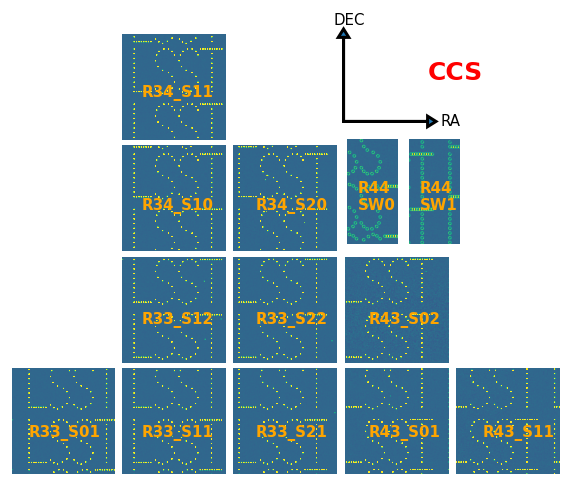

In [37]:
plot_corner_with_annotations(mosaic,vmin=-10,vmax=20)

Plot the same with butler with wcs:

In [38]:
def plot_butler_with_wcs(repo_dir, detector='R22_S10', 
                         inst_file ='/project/scichris/aos/images/lsstCam/lsstCam_entire_tiled_LSST.inst'):
    zscale = ZScaleInterval()

    instrument = 'LSSTCam'
    #repo_dir = '/project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_all_rot/DATA/'
    butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                     f'{instrument}/calib','run1',
                                                     f'{instrument}/calib/unbounded'],
                                 )

    dataId0 = dict(instrument=instrument)
    dataset = next(iter(butler.registry.queryDatasets(
                        datasetType='raw',
                        dataId=dataId0  )))

    expN = dataset.dataId["exposure"]

    exposure = butler.get('postISRCCD', detector=detector, 
                          instrument=instrument,exposure=expN,
              collections=['run1'])
    detector  = exposure.getDetector()
    data = exposure.image.array

    vmin, vmax = zscale.get_limits(data)

    fig = plt.figure(figsize=(12, 12))

    # plot in DVCS 
    plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
    plt.colorbar()
    plt.xlabel('x [px]')
    plt.ylabel('y [px]')

    plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')


    # read in the input instance catalog 
    # that is the reference catalog 
    cat = np.genfromtxt(inst_file,
                            skip_header=16)

    cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])

    # get the wcs 
    wcs = exposure.getWcs()

    # calculate the position given the x,y 
    x,y= wcs.skyToPixelArray(cat_df['ra'], cat_df['dec'],degrees=True)

    # plot the WCS
    plt.scatter(x,y,  facecolors='none', edgecolors='r', marker='o', s=50, label='phoSim WCS')

    plt.xlim(0,4000)
    plt.ylim(0,4000)
    plt.legend(fontsize=18)
    detectorName, detectorType = detector.getName(), detector.getSerial()[:3] 
    #plt.savefig(f'letter_lsstCam_entire_tiled_LSST_all_rot{detectorName}_{detectorType}.jpeg',
    #           bbox_inches='tight', dpi=150)

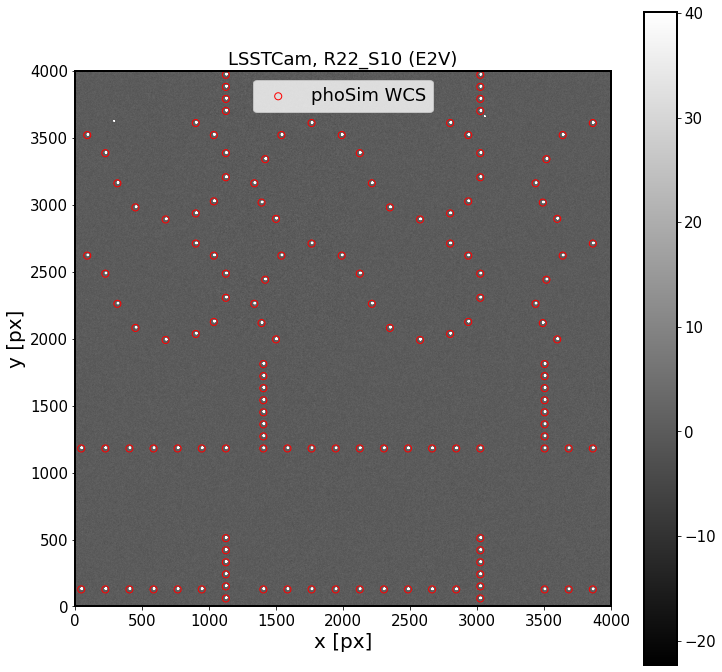

In [39]:
plot_butler_with_wcs(repo_dir=repo_before)

As shown above, `plt.imshow(exposure.image.array, origin='lower')`   is in DVCS, and the WCS is aligned with the Image Array.

To convert this from DVCS to CCS, i.e. if we wish to display the image with ra increasing to the right, dec to the top (CCS), we need to take the transpose,  which also necessitates the transpose of the WCS. 



## Summary note about coordinate systems:

DVCS: 
* butler `plt.imshow(exposure.image.array, origin='lower')` 
* cameraGeom `mosaic = cameraGeomUtils.showCamera`


CCS:
* butler `plt.imshow(exposure.image.array.T, origin='lower')`
* cameraGeom `plt.imshow(mosaic.array.T, origin='lower')` 



## After: lsstCam (no changes to lsstComCam)


Changed  R04_SW0, R00_SW0, R40_SW0, R44_SW0 by +180  and kept SW1 unchanged    - simulate the entire focal plane. 

Executed the following commands (on `lsst-devl02` )
    
    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib
    
    source "/project/scichris/aos/setup_aos_current.sh"
    
    
    
    python /project/scichris/aos/AOS/update_focalplanelayout_lsst.py  --update_euler  
    cd /project/scichris/aos/phosim_syseng4/data/lsst/
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt
    
    
    cd /project/scichris/aos/images/lsstCam
    mkdir letter_lsstCam_entire_tiled_LSST_all_rot
    mkdir letter_lsstCam_entire_tiled_LSST_all_rot/raw
    cd letter_lsstCam_entire_tiled_LSST_all_rot
    
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/lsstCam_entire_tiled_LSST.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25  -o /project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_all_rot/raw/ > starPhoSimLetter.log 2>&1


    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_all_rot/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_all_rot/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh               
    

Plot the mosaic of the full focal plane:

Reading 189: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 189, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 190: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 190, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 193: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 193, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 194: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 194, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 197: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 197, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam

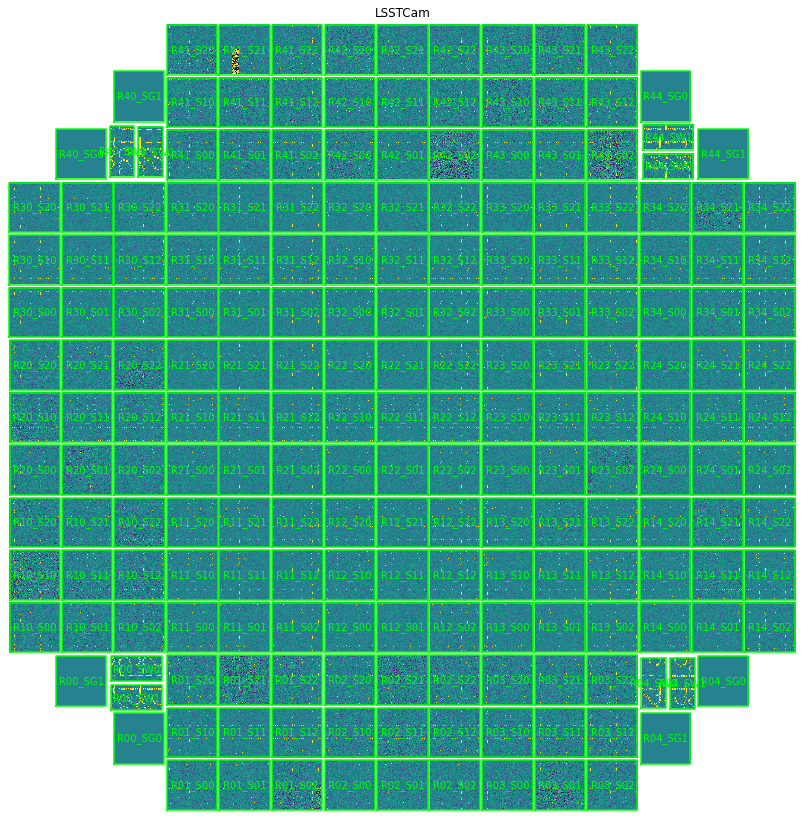

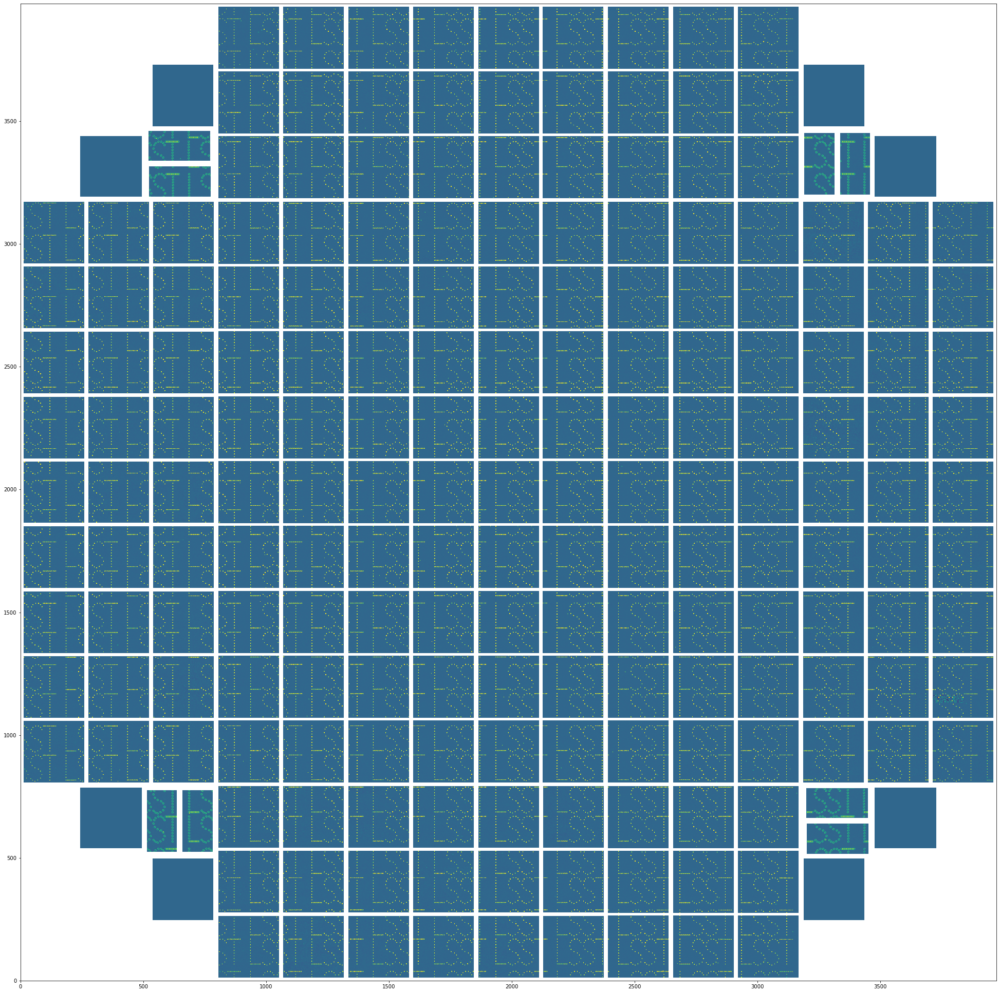

In [6]:
repo_after = '/project/scichris/aos/images/lsstCam/letter_lsstCam_entire_tiled_LSST_all_rot/DATA/'
mos = plot_cameraGeom(repo_dir = repo_after, detectorNameList=None)

fig,ax = plt.subplots(1,1,figsize=(35,35))
ax.imshow(mos.array.T, origin='lower', vmax=20, vmin=-10)
plt.savefig('letter_lsstCam_entire_tiled_LSST_all_rot.pdf', bbox_inches='tight', dpi=150)


Zoom into one corner:

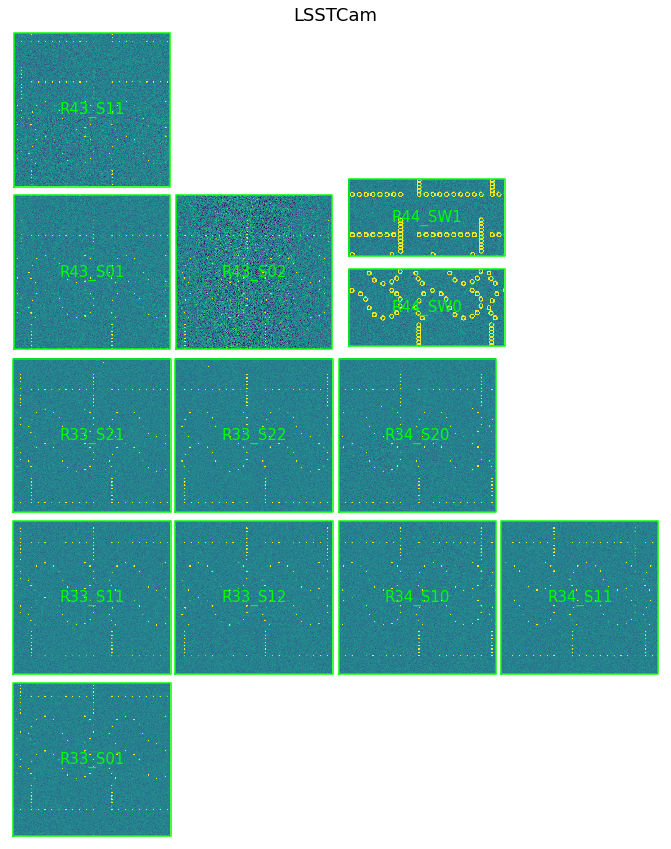

In [40]:
mosaic = plot_cameraGeom(repo_dir = repo_after, detectorNameList=corner_list)

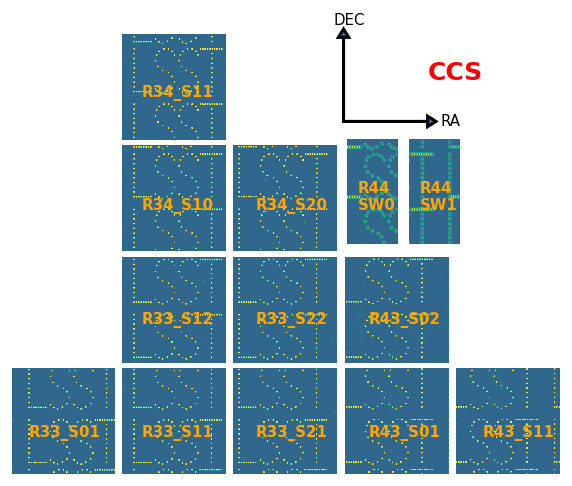

In [41]:
plot_corner_with_annotations(mosaic,vmin=-10,vmax=20)

## Show the OPD before and after 

We evaluate OPD at mid-point between the two defocal corner half-sensors:

before: 

    ssh lsst-devl02
    screen -x aos

    cd /project/scichris/aos/AOS/DM-28360/wfs/opd/
    mkdir Pert00
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/AOS/DM-28360/opd_wfs.inst -i lsst -e 1     -c /project/scichris/aos/AOS/DM-28360/noBkgndPert00_NCSA.cmd -w /project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00 -p 24  -o /project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00 > /project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00/opdPhoSim.log 2>&1
    
    
after updating Euler angle by 180 degrees for SW0 : 

    ssh lsst-devl02
    screen -x aos

    cd /project/scichris/aos/AOS/DM-28360/wfs/opd/
    mkdir Pert00_SW0_Euler
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/AOS/DM-28360/opd_wfs.inst -i lsst -e 1     -c /project/scichris/aos/AOS/DM-28360/noBkgndPert00_NCSA.cmd -w /project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00_SW0_Euler -p 24  -o /project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00_SW0_Euler > /project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00_SW0_Euler/opdPhoSim.log 2>&1 

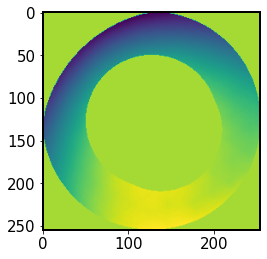

In [8]:
# small pert, before updates
from astropy.io import fits
hdul = fits.open('/project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00/opd_9000000_0.fits.gz')
import matplotlib.pyplot as plt 
plt.imshow(hdul[0].data)



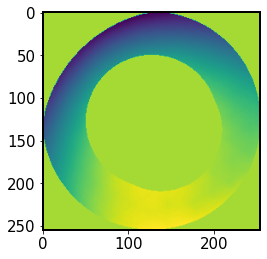

In [9]:
# small pert, after updates 
from astropy.io import fits
hdul_ = fits.open('/project/scichris/aos/AOS/DM-28360/wfs/opd/Pert00_SW0_Euler/opd_9000000_0.fits.gz')
import matplotlib.pyplot as plt 
plt.imshow(hdul[0].data)

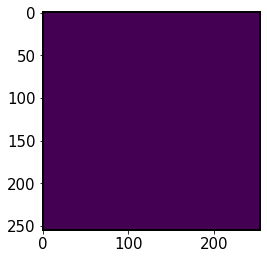

In [10]:
plt.imshow(hdul[0].data-hdul_[0].data)

They are indeed identical. We don't expect change to OPD because while we rotated the Euler angle of SWO detectors by 180 deg, the mirrors and the optical system did not change. OPD would only be different if we imposed different mirror perturbations, or altered the orientation of the elements of the optical system, changing the wavefront **before** it hits the detector. 